In [1]:
%pip install -Uq matplotlib
import matplotlib
import matplotlib.pyplot as plt
import nltk
from nltk.corpus import wordnet
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger_ru')
nltk.download('wordnet')
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import sent_tokenize, word_tokenize
nltk.download('universal_tagset')
from nltk.stem import SnowballStemmer



[notice] A new release of pip available: 22.3.1 -> 23.3
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Елизавета\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger_ru to
[nltk_data]     C:\Users\Елизавета\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping taggers\averaged_perceptron_tagger_ru.zip.
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Елизавета\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package universal_tagset to
[nltk_data]     C:\Users\Елизавета\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping taggers\universal_tagset.zip.


In [2]:
with open("1_Nahalenok_1925.txt", "r", encoding="utf-8") as file:
    text1 = file.read()

In [3]:
sentences = sent_tokenize(text1, language='russian')

for sentence in sentences:
    words = nltk.word_tokenize(sentence)
    tag_words = nltk.pos_tag(words, lang='rus') 
    
    print(tag_words)

[('Снится', 'V'), ('Мишке', 'S'), (',', 'NONLEX'), ('будто', 'CONJ'), ('дед', 'S'), ('срезал', 'V'), ('в', 'PR'), ('саду', 'S'), ('здоровенную', 'A=f'), ('вишневую', 'A=f'), ('хворостину', 'S'), (',', 'NONLEX'), ('идет', 'V'), ('к', 'PR'), ('нему', 'S-PRO'), (',', 'NONLEX'), ('хворостиной', 'A=sg'), ('машет', 'S'), (',', 'NONLEX'), ('а', 'CONJ'), ('сам', 'A-PRO=m'), ('строго', 'ADV'), ('так', 'ADV-PRO'), ('говорит', 'V'), ('.', 'NONLEX')]
[('—', 'NONLEX'), ('А', 'CONJ'), ('ну', 'PART'), (',', 'NONLEX'), ('иди', 'V'), ('сюда', 'ADV-PRO'), (',', 'NONLEX'), ('Михайло', 'S'), ('Фомич', 'S'), (',', 'NONLEX'), ('я', 'S-PRO'), ('те', 'A-PRO=pl'), ('полохану', 'V'), ('по', 'PR'), ('тем', 'A-PRO=pl'), ('местам', 'S'), (',', 'NONLEX'), ('откель', 'S'), ('ноги', 'S'), ('растут', 'V'), ('!', 'NONLEX'), ('..', 'NONLEX')]
[('—', 'V'), ('За', 'PR'), ('что', 'S-PRO'), (',', 'NONLEX'), ('дедуня', 'S'), ('?', 'NONLEX')]
[('—', 'NONLEX'), ('спрашивает', 'V'), ('Мишка', 'S'), ('.', 'NONLEX')]
[('—', 'NONL

In [4]:
sentences = sent_tokenize(text1, language='russian')
lemmatizer = WordNetLemmatizer()

#Обработка каждого предложения
for sentence in sentences:
    
    words = word_tokenize(sentence)
    #Лемматизация
    lemmatized = [lemmatizer.lemmatize(word) for word in words]
    print(words)
    print(' '.join(lemmatized))

['Снится', 'Мишке', ',', 'будто', 'дед', 'срезал', 'в', 'саду', 'здоровенную', 'вишневую', 'хворостину', ',', 'идет', 'к', 'нему', ',', 'хворостиной', 'машет', ',', 'а', 'сам', 'строго', 'так', 'говорит', '.']
Снится Мишке , будто дед срезал в саду здоровенную вишневую хворостину , идет к нему , хворостиной машет , а сам строго так говорит .
['—', 'А', 'ну', ',', 'иди', 'сюда', ',', 'Михайло', 'Фомич', ',', 'я', 'те', 'полохану', 'по', 'тем', 'местам', ',', 'откель', 'ноги', 'растут', '!', '..']
— А ну , иди сюда , Михайло Фомич , я те полохану по тем местам , откель ноги растут ! ..
['—', 'За', 'что', ',', 'дедуня', '?']
— За что , дедуня ?
['—', 'спрашивает', 'Мишка', '.']
— спрашивает Мишка .
['—', 'А', 'за', 'то', ',', 'что', 'ты', 'в', 'курятнике', 'из', 'гнезда', 'чубатой', 'курицы', 'все', 'яйца', 'покрал', 'и', 'на', 'каруселю', 'отнес', ',', 'прокатал', '!', '..']
— А за то , что ты в курятнике из гнезда чубатой курицы все яйца покрал и на каруселю отнес , прокатал ! ..
['—', 

In [5]:
# лемматизация с учетом части речи
# меняем теги
tokenized = nltk.word_tokenize(text1)
tagged = nltk.pos_tag(tokenized)

def pos_tagger(nltk_tag):
    if nltk_tag.startswith('J'):
        return nltk.corpus.wordnet.ADJ
    elif nltk_tag.startswith('V'):
        return nltk.corpus.wordnet.VERB
    elif nltk_tag.startswith('N'):
        return nltk.corpus.wordnet.NOUN
    elif nltk_tag.startswith('R'):
        return nltk.corpus.wordnet.ADV
    else:          
        return None

tagged

[('Снится', 'NN'),
 ('Мишке', 'NN'),
 (',', ','),
 ('будто', 'NNP'),
 ('дед', 'NNP'),
 ('срезал', 'NNP'),
 ('в', 'NNP'),
 ('саду', 'NNP'),
 ('здоровенную', 'NNP'),
 ('вишневую', 'NNP'),
 ('хворостину', 'NNP'),
 (',', ','),
 ('идет', 'NNP'),
 ('к', 'NNP'),
 ('нему', 'NNP'),
 (',', ','),
 ('хворостиной', 'NNP'),
 ('машет', 'NNP'),
 (',', ','),
 ('а', 'NNP'),
 ('сам', 'NNP'),
 ('строго', 'NNP'),
 ('так', 'NNP'),
 ('говорит', 'NNP'),
 ('.', '.'),
 ('—', 'VB'),
 ('А', 'JJ'),
 ('ну', 'NNP'),
 (',', ','),
 ('иди', 'NNP'),
 ('сюда', 'NNP'),
 (',', ','),
 ('Михайло', 'NNP'),
 ('Фомич', 'NNP'),
 (',', ','),
 ('я', 'NNP'),
 ('те', 'NNP'),
 ('полохану', 'NNP'),
 ('по', 'NNP'),
 ('тем', 'NNP'),
 ('местам', 'NNP'),
 (',', ','),
 ('откель', 'NNP'),
 ('ноги', 'NNP'),
 ('растут', 'NN'),
 ('!', '.'),
 ('..', 'JJ'),
 ('—', 'JJ'),
 ('За', 'NN'),
 ('что', 'NN'),
 (',', ','),
 ('дедуня', 'VB'),
 ('?', '.'),
 ('—', 'JJ'),
 ('спрашивает', 'NN'),
 ('Мишка', 'NNP'),
 ('.', '.'),
 ('—', 'VB'),
 ('А', 'JJ'),
 ('з

In [6]:
# NOUN - существительное.
# ADJ - прилагательное.
# VERB - глагол.
# ADV - наречие.
# PRON - местоимение.
# NUM - числительное.
# CONJ - союз.
# ADP - предлог.
# DET - детерминер (определитель).
# PRT - частица.
# X - другое.

In [7]:
from collections import Counter
lower_case = text1.lower()
tokens = nltk.word_tokenize(lower_case)
tags = nltk.pos_tag(tokens)
counts = Counter( tag for word,  tag in tags)
print(counts)

# Имен собственных больше всего, значит много диалогов
# Глаголы в настоящем времени, события происходят в моменте 

Counter({'NNP': 5572, ',': 973, 'JJ': 819, 'NN': 753, '.': 693, 'VB': 297, ':': 134, 'CC': 15, '(': 1, ')': 1, 'FW': 1, 'IN': 1, 'CD': 1})


In [8]:
# S: существительное.
# NONLEX: нелексическое слово (например, междометия и другие нелексические элементы).
# V: глагол.
# PR: предлог.
# CONJ: союз.
# S-PRO: местоимение существительное (например, "он", "она").
# ADV: наречие.
# PART: частица.
# ADV-PRO: местоимение-наречие (например, "где", "как").
# A=m, A=f, A=pl: прилагательные с разными морфологическими признаками (род и число).
# A-PRO=m, A-PRO=f, A-PRO=pl: местоименные прилагательные с разными морфологическими признаками.
# PRAEDIC: причастие или деепричастие.
# A=n, A=sg: прилагательные с другими морфологическими признаками (род и число).
# NUM=nom, NUM=acc, NUM=m, NUM=f: числительные с разными морфологическими признаками.
# INTJ: междометие (слова-восклицания).
# A=brev: краткое прилагательное.
# PARENTH: вводное слово.
# ADV=comp, ADV=comp2: сравнительные степени наречия.
# A-PRO=n: местоименное прилагательное с другими морфологическими признаками.

In [9]:
from collections import Counter
lower_case = text1.lower()
tokens = nltk.word_tokenize(lower_case)
tags = nltk.pos_tag(tokens, lang='rus')
counts = Counter( tag for word,  tag in tags)
print(counts)

# много междометий 

Counter({'S': 2352, 'NONLEX': 2240, 'V': 1614, 'PR': 890, 'CONJ': 511, 'S-PRO': 449, 'ADV': 256, 'PART': 220, 'ADV-PRO': 120, 'A=m': 112, 'A=f': 99, 'A=pl': 74, 'A-PRO=m': 62, 'A-PRO=f': 39, 'A-PRO=pl': 37, 'PRAEDIC': 29, 'A=n': 24, 'A=sg': 18, 'NUM=nom': 15, 'A-PRO=sg': 12, 'INTJ': 11, 'A-PRO': 10, 'PARENTH': 9, 'ADV=comp': 7, 'A-PRO=n': 6, 'A': 5, 'S-PRO=dat': 4, 'NUM=acc': 4, 'S-PRO=acc': 3, 'NUM=m': 3, 'S-PRO=ins': 3, 'ANUM=f': 3, 'ANUM=n': 2, 'S-PRO=pl': 2, 'ANUM=m': 2, 'A=brev': 2, 'NUM=f': 2, 'ADV=comp2': 2, 'PRAEDIC=comp': 2, 'ANUM=sg': 1, 'S-PRO=gen': 1, 'A=comp': 1, 'PRAEDIC-PRO': 1, 'NUM': 1, 'NUM=ciph': 1})


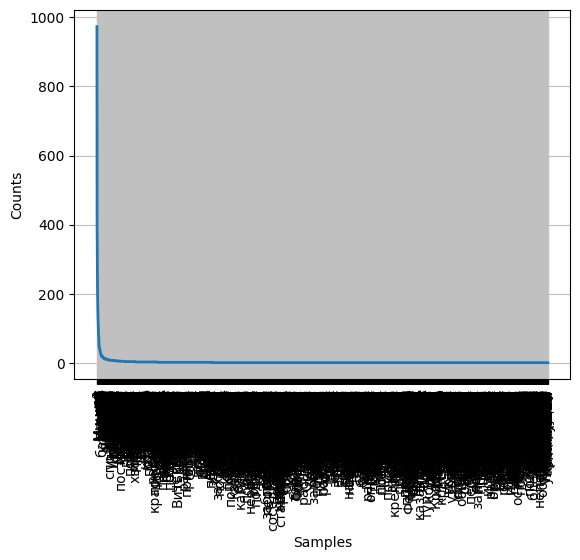

<Axes: xlabel='Samples', ylabel='Counts'>

In [10]:
words = nltk.tokenize.word_tokenize(text1)
fd = nltk.FreqDist(words)
fd.plot()
# На графике можно увидеть только имя Мишка ) этот способ анализа не подходит

In [11]:
text = ''' Снится Мишке, будто дед срезал в саду здоровенную вишневую хворостину, идет к нему, хворостиной машет, а сам строго так говорит.
 — А ну, иди сюда, Михайло Фомич, я те полохану по тем местам, откель ноги растут!..
 — За что, дедуня? — спрашивает Мишка.
 — А за то, что ты в курятнике из гнезда чубатой курицы все яйца покрал и на каруселю отнес, прокатал!..
 — Дедуня, я нонешний год не катался на каруселях! — в страхе кричит Мишка.
 Но дед степенно разгладил бороду да как топнет ногой:
 — Ложись, постреленыш, и спущай портки!..
 Вскрикнул Мишка и проснулся. Сердце бьется, словно в самом деле хворостины отпробовал. Чуточку открыл левый глаз — в хате светло. Утренняя зорька теплится за окошком. Приподнял Мишка голову, слышит в сенцах голоса: мамка визжит, лопочет что-то, смехом захлебывается, дед кашляет, а чей-то чужой голос: «Бу-бу-бу…»
 Протер Мишка глаза и видит: дверь открылась, хлопнула, дед в горницу бежит, подпрыгивает, очки на носу у него болтаются. Мишка сначала подумал, что поп с певчими пришел (на Пасху когда приходил он, дед так же суетился), да следом за дедом прет в горницу чужой большущий солдат в черной шинели и в шапке с лентами, но без козырька, а мамка на шее у него висит, воет.
 Посреди хаты стряхнул чужой человек мамку с шеи да как гаркнет:
 — А где мое потомство?'''

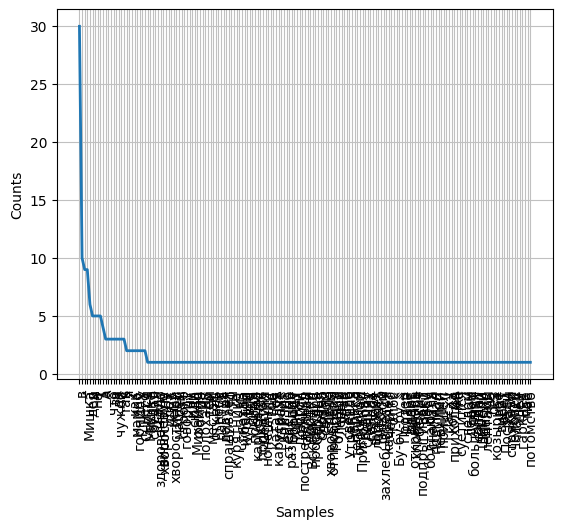

<Axes: xlabel='Samples', ylabel='Counts'>

In [12]:
words = nltk.tokenize.word_tokenize(text)
fd = nltk.FreqDist(words)
fd.plot()
# На графике можно увидеть только имя Мишка ) этот способ анализа не подходит

In [13]:
stemmer = SnowballStemmer("russian")

words = word_tokenize(text1)
for w in words:
    root_word = stemmer.stem(w)
    print(root_word)
    


снит
мишк
,
будт
дед
среза
в
сад
здоровен
вишнев
хворостин
,
идет
к
нем
,
хворостин
машет
,
а
сам
строг
так
говор
.
—
а
ну
,
ид
сюд
,
михайл
фомич
,
я
те
полохан
по
тем
мест
,
откел
ног
растут
!
..
—
за
что
,
дедун
?
—
спрашива
мишк
.
—
а
за
то
,
что
ты
в
курятник
из
гнезд
чубат
куриц
все
яйц
покра
и
на
карусел
отнес
,
проката
!
..
—
дедун
,
я
нонешн
год
не
ката
на
карусел
!
—
в
страх
крич
мишк
.
но
дед
степен
разглад
бород
да
как
топнет
ног
:
—
лож
,
постреленыш
,
и
спуща
портк
!
..
вскрикнул
мишк
и
проснул
.
сердц
бьет
,
словн
в
сам
дел
хворостин
отпробова
.
чуточк
откр
лев
глаз
—
в
хат
светл
.
утрен
зорьк
тепл
за
окошк
.
приподня
мишк
голов
,
слыш
в
сенц
голос
:
мамк
визж
,
лопочет
что-т
,
смех
захлебыва
,
дед
кашля
,
а
чей-т
чуж
голос
:
«
бу-бу-бу…
»
протер
мишк
глаз
и
вид
:
двер
откр
,
хлопнул
,
дед
в
горниц
беж
,
подпрыгива
,
очк
на
нос
у
нег
болта
.
мишк
снача
подума
,
что
поп
с
певч
пришел
(
на
пасх
когд
приход
он
,
дед
так
же
сует
)
,
да
след
за
дед
прет
в
горниц
чуж
большущ
с

In [14]:
tokenizer = nltk.tokenize.BlanklineTokenizer()
tokens = tokenizer.tokenize(text1)
print(len(tokenizer.tokenize(text1)))
# print(tokenizer.tokenize(text1))
print('Разделение текста по абзацам')


13
Разделение текста по абзацам


In [15]:
tokenizer = nltk.tokenize.WhitespaceTokenizer()
print(len(tokenizer.tokenize(text1)))
print(tokenizer.tokenize(text1))

7299
['Снится', 'Мишке,', 'будто', 'дед', 'срезал', 'в', 'саду', 'здоровенную', 'вишневую', 'хворостину,', 'идет', 'к', 'нему,', 'хворостиной', 'машет,', 'а', 'сам', 'строго', 'так', 'говорит.', '—', 'А', 'ну,', 'иди', 'сюда,', 'Михайло', 'Фомич,', 'я', 'те', 'полохану', 'по', 'тем', 'местам,', 'откель', 'ноги', 'растут!..', '—', 'За', 'что,', 'дедуня?', '—', 'спрашивает', 'Мишка.', '—', 'А', 'за', 'то,', 'что', 'ты', 'в', 'курятнике', 'из', 'гнезда', 'чубатой', 'курицы', 'все', 'яйца', 'покрал', 'и', 'на', 'каруселю', 'отнес,', 'прокатал!..', '—', 'Дедуня,', 'я', 'нонешний', 'год', 'не', 'катался', 'на', 'каруселях!', '—', 'в', 'страхе', 'кричит', 'Мишка.', 'Но', 'дед', 'степенно', 'разгладил', 'бороду', 'да', 'как', 'топнет', 'ногой:', '—', 'Ложись,', 'постреленыш,', 'и', 'спущай', 'портки!..', 'Вскрикнул', 'Мишка', 'и', 'проснулся.', 'Сердце', 'бьется,', 'словно', 'в', 'самом', 'деле', 'хворостины', 'отпробовал.', 'Чуточку', 'открыл', 'левый', 'глаз', '—', 'в', 'хате', 'светло.', 'У

In [16]:
tokenizer = nltk.data.load('tokenizers/punkt/russian.pickle')
tokens = tokenizer.tokenize(text1)
tokens


['\n Снится Мишке, будто дед срезал в саду здоровенную вишневую хворостину, идет к нему, хворостиной машет, а сам строго так говорит.',
 '—\xa0А ну, иди сюда, Михайло Фомич, я те полохану по тем местам, откель ноги растут!..',
 '—\xa0За что, дедуня?',
 '— спрашивает Мишка.',
 '—\xa0А за то, что ты в курятнике из гнезда чубатой курицы все яйца покрал и на каруселю отнес, прокатал!..',
 '—\xa0Дедуня, я нонешний год не катался на каруселях!',
 '— в страхе кричит Мишка.',
 'Но дед степенно разгладил бороду да как топнет ногой:\n —\xa0Ложись, постреленыш, и спущай портки!..',
 'Вскрикнул Мишка и проснулся.',
 'Сердце бьется, словно в самом деле хворостины отпробовал.',
 'Чуточку открыл левый глаз — в хате светло.',
 'Утренняя зорька теплится за окошком.',
 'Приподнял Мишка голову, слышит в сенцах голоса: мамка визжит, лопочет что-то, смехом захлебывается, дед кашляет, а чей-то чужой голос: «Бу-бу-бу…»\n Протер Мишка глаза и видит: дверь открылась, хлопнула, дед в горницу бежит, подпрыгивает

In [17]:
with open("2_Lazorevaya_step_1926.txt", "r", encoding="utf-8") as file:
    text2 = file.read()

In [18]:
sentences = sent_tokenize(text2, language='russian')

for sentence in sentences:
    words = nltk.word_tokenize(sentence)
    tag_words = nltk.pos_tag(words, lang='rus') 
    
    print(tag_words)

[('Над', 'PR'), ('Доном', 'S'), (',', 'NONLEX'), ('на', 'PR'), ('облысевшем', 'V'), ('от', 'PR'), ('солнечного', 'A=m'), ('жара', 'S'), ('бугре', 'S'), (',', 'NONLEX'), ('под', 'PR'), ('кустом', 'S'), ('дикого', 'A=m'), ('терна', 'S'), ('лежим', 'S'), ('мы', 'S-PRO'), (':', 'NONLEX'), ('дед', 'S'), ('Захар', 'S'), ('и', 'CONJ'), ('я.', 'S'), ('Рядом', 'ADV'), ('с', 'PR'), ('чешуйчатой', 'S'), ('грядкой', 'A=f'), ('туч', 'S'), ('бродит', 'V'), ('коричневый', 'A=m'), ('коршун', 'S'), ('.', 'NONLEX')]
[('Листья', 'S'), ('терна', 'S'), (',', 'NONLEX'), ('пестро', 'ADV'), ('окрашенные', 'V'), ('птичьим', 'V'), ('пометом', 'S'), (',', 'NONLEX'), ('не', 'PART'), ('дают', 'V'), ('нам', 'S-PRO'), ('прохлады', 'S'), ('.', 'NONLEX')]
[('От', 'PR'), ('зноя', 'S'), ('в', 'PR'), ('ушах', 'S'), ('горячий', 'A=m'), ('звон', 'S'), (';', 'NONLEX'), ('когда', 'ADV-PRO'), ('смотришь', 'V'), ('вниз', 'ADV'), ('на', 'PR'), ('курчавую', 'A=f'), ('рябь', 'S'), ('Дона', 'S'), ('или', 'CONJ'), ('под', 'PR'), ('

[('—', 'NONLEX'), ('Видишь', 'V'), (',', 'NONLEX'), ('за', 'PR'), ('энтим', 'A-PRO=m'), ('логом', 'S'), ('макушки', 'S'), ('тополев', 'S'), ('?', 'NONLEX')]
[('Имение', 'S'), ('панов', 'S'), ('Томилиных', 'A=pl'), ('—', 'S'), ('Тополевка', 'S'), ('.', 'NONLEX')]
[('Там', 'ADV-PRO'), ('же', 'PART'), ('около', 'PR'), ('и', 'CONJ'), ('мужичий', 'A=m'), ('поселок', 'S'), ('Тополевка', 'S'), (',', 'NONLEX'), ('раньше', 'ADV=comp'), ('крепостные', 'A=pl'), ('были', 'V'), ('.', 'NONLEX')]
[('Отец', 'S'), ('мой', 'A-PRO=m'), ('кучеровал', 'S'), ('у', 'PR'), ('пана', 'V'), ('до', 'PR'), ('смерти', 'S'), ('.', 'NONLEX')]
[('Мне-то', 'PARENTH'), (',', 'NONLEX'), ('огольцу', 'S'), (',', 'NONLEX'), ('он', 'S-PRO'), ('рассказывал', 'V'), (',', 'NONLEX'), ('как', 'CONJ'), ('пан', 'S'), ('Евграф', 'S'), ('Томилин', 'S'), ('выменял', 'V'), ('его', 'S-PRO'), ('за', 'PR'), ('ручного', 'A=m'), ('журавля', 'S'), ('у', 'PR'), ('соседа-помещика', 'S'), ('.', 'NONLEX')]
[('Посля', 'S'), ('отцовой', 'A=f'), ('

In [19]:
# лемматизация с учетом части речи
# меняем теги
tokenized = nltk.word_tokenize(text2)
tagged = nltk.pos_tag(tokenized)

def pos_tagger(nltk_tag):
    if nltk_tag.startswith('J'):
        return nltk.corpus.wordnet.ADJ
    elif nltk_tag.startswith('V'):
        return nltk.corpus.wordnet.VERB
    elif nltk_tag.startswith('N'):
        return nltk.corpus.wordnet.NOUN
    elif nltk_tag.startswith('R'):
        return nltk.corpus.wordnet.ADV
    else:          
        return None

tagged

[('Над', 'NN'),
 ('Доном', 'NN'),
 (',', ','),
 ('на', 'NNP'),
 ('облысевшем', 'NNP'),
 ('от', 'NNP'),
 ('солнечного', 'NNP'),
 ('жара', 'NNP'),
 ('бугре', 'NNP'),
 (',', ','),
 ('под', 'NNP'),
 ('кустом', 'NNP'),
 ('дикого', 'NNP'),
 ('терна', 'NNP'),
 ('лежим', 'NNP'),
 ('мы', 'NN'),
 (':', ':'),
 ('дед', 'JJ'),
 ('Захар', 'NNP'),
 ('и', 'NNP'),
 ('я.', 'NNP'),
 ('Рядом', 'NNP'),
 ('с', 'NNP'),
 ('чешуйчатой', 'NNP'),
 ('грядкой', 'NNP'),
 ('туч', 'NNP'),
 ('бродит', 'NNP'),
 ('коричневый', 'NNP'),
 ('коршун', 'NNP'),
 ('.', '.'),
 ('Листья', 'NN'),
 ('терна', 'NN'),
 (',', ','),
 ('пестро', 'NNP'),
 ('окрашенные', 'NNP'),
 ('птичьим', 'NNP'),
 ('пометом', 'NNP'),
 (',', ','),
 ('не', 'NNP'),
 ('дают', 'NNP'),
 ('нам', 'NNP'),
 ('прохлады', 'NNP'),
 ('.', '.'),
 ('От', 'VB'),
 ('зноя', 'JJ'),
 ('в', 'NNP'),
 ('ушах', 'NNP'),
 ('горячий', 'NNP'),
 ('звон', 'NNP'),
 (';', ':'),
 ('когда', 'NNP'),
 ('смотришь', 'NNP'),
 ('вниз', 'NNP'),
 ('на', 'NNP'),
 ('курчавую', 'NNP'),
 ('рябь', 'N

In [20]:
from collections import Counter
lower_case = text2.lower()
tokens = nltk.word_tokenize(lower_case)
tags = nltk.pos_tag(tokens)
counts = Counter( tag for word,  tag in tags)
print(counts)

# Предполагаю, что диалогов меньше, так как имен собственных в 2,5 раза меньше, чем в 1 тексте.
# Возможно потому что текст меньше по объему, буду проверять дальше

Counter({'NNP': 2055, ',': 364, '.': 200, 'NN': 198, 'JJ': 196, 'VB': 100, ':': 37, 'CC': 4, 'CD': 2, 'VBD': 1})


In [21]:
from collections import Counter
lower_case = text2.lower()
tokens = nltk.word_tokenize(lower_case)
tags = nltk.pos_tag(tokens, lang='rus')
counts = Counter( tag for word,  tag in tags)
print(counts)

Counter({'S': 868, 'NONLEX': 675, 'V': 538, 'PR': 310, 'CONJ': 171, 'S-PRO': 136, 'ADV': 72, 'PART': 62, 'A=m': 50, 'A=pl': 45, 'A=f': 42, 'ADV-PRO': 39, 'A-PRO=m': 30, 'A-PRO=pl': 18, 'A-PRO=f': 16, 'A=n': 9, 'A=sg': 8, 'PARENTH': 7, 'A-PRO': 7, 'NUM=acc': 6, 'A-PRO=sg': 6, 'A=comp': 4, 'PRAEDIC': 4, 'NUM=m': 4, 'ANUM=m': 4, 'S-PRO=gen': 3, 'NUM=f': 3, 'A-PRO=n': 3, 'S-PRO=acc': 3, 'NUM=ciph': 2, 'NUM=nom': 2, 'ANUM=f': 2, 'INTJ': 2, 'S-PRO=dat': 2, 'ADV=comp2': 1, 'ADV=comp': 1, 'NUM=gen': 1, 'NUM=comp': 1})


In [22]:
tokenizer = nltk.tokenize.BlanklineTokenizer()
tokens = tokenizer.tokenize(text2)
print(len(tokenizer.tokenize(text2)))
# print(tokenizer.tokenize(text1))
print('Разделение текста по абзацам')

# Один абзац, думаю, поэтому и диалогов меньше в 2,5 раза. Нужно посмотреть объем токенов
# Но это наталкивает на мысль, что тексты в основном состоят из диалогов

1
Разделение текста по абзацам


In [23]:
tokenizer = nltk.tokenize.WhitespaceTokenizer()
print(len(tokenizer.tokenize(text2)))
print(tokenizer.tokenize(text2))
# текст действительно маленький. Стал ли Шолохов писать только маленькие произведения, пока писал Тихий Дон?

2537
['Над', 'Доном,', 'на', 'облысевшем', 'от', 'солнечного', 'жара', 'бугре,', 'под', 'кустом', 'дикого', 'терна', 'лежим', 'мы:', 'дед', 'Захар', 'и', 'я.', 'Рядом', 'с', 'чешуйчатой', 'грядкой', 'туч', 'бродит', 'коричневый', 'коршун.', 'Листья', 'терна,', 'пестро', 'окрашенные', 'птичьим', 'пометом,', 'не', 'дают', 'нам', 'прохлады.', 'От', 'зноя', 'в', 'ушах', 'горячий', 'звон;', 'когда', 'смотришь', 'вниз', 'на', 'курчавую', 'рябь', 'Дона', 'или', 'под', 'ноги', 'на', 'сморщенные', 'арбузные', 'корки', '—', 'в', 'рот', 'набегает', 'тягучая', 'слюна,', 'и', 'слюну', 'эту', 'лень', 'сплевывать.', 'В', 'лощине,', 'возле', 'высыхающей', 'музги,', 'овцы', 'жмутся', 'в', 'тесные', 'кучи.', 'Устало', 'откинув', 'зады,', 'виляют', 'захлюстанными', 'курдюками,', 'надрывно', 'чихают', 'от', 'пыли.', 'У', 'плотины', 'здоровенный', 'ягночище,', 'упираясь', 'задними', 'ногами,', 'сосет', 'грязножелтую', 'овцу.', 'Изредка', 'поддает', 'головой', 'в', 'материно', 'вымя;', 'овца', 'стонет,', 'г

In [24]:
with open("3_Tihii_don_tom_1_1928-1940.txt", "r", encoding="utf-8") as file:
    text3 = file.read()

In [25]:
sentences = sent_tokenize(text3, language='russian')

for sentence in sentences:
    words = nltk.word_tokenize(sentence)
    tag_words = nltk.pos_tag(words, lang='rus') 
    
    print(tag_words)

[('I', 'ANUM=ciph'), ('Мелеховский', 'A=m'), ('двор', 'S'), ('–', 'S'), ('на', 'PR'), ('самом', 'A-PRO=m'), ('краю', 'S'), ('хутора', 'S'), ('.', 'NONLEX')]
[('Воротца', 'S'), ('со', 'PR'), ('скотиньего', 'A=m'), ('база', 'S'), ('ведут', 'V'), ('на', 'PR'), ('север', 'S'), ('к', 'PR'), ('Дону', 'S'), ('.', 'NONLEX')]
[('Крутой', 'A=m'), ('восьмисаженный', 'A=m'), ('спуск', 'S'), ('меж', 'PR'), ('замшелых', 'S'), ('в', 'PR'), ('прозелени', 'S'), ('меловых', 'A=pl'), ('глыб', 'S'), (',', 'NONLEX'), ('и', 'CONJ'), ('вот', 'PART'), ('берег', 'S'), (':', 'NONLEX'), ('перламутровая', 'A=f'), ('россыпь', 'S'), ('ракушек', 'S'), (',', 'NONLEX'), ('серая', 'A=f'), ('изломистая', 'A=f'), ('кайма', 'S'), ('нацелованной', 'A=f'), ('волнами', 'S'), ('гальки', 'S'), ('и', 'CONJ'), ('дальше', 'A=comp'), ('–', 'NONLEX'), ('перекипающее', 'V'), ('под', 'PR'), ('ветром', 'S'), ('вороненой', 'A=f'), ('рябью', 'V'), ('стремя', 'S'), ('Дона', 'S'), ('.', 'NONLEX')]
[('На', 'PR'), ('восток', 'S'), (',', 'NO

In [26]:
# лемматизация с учетом части речи
# меняем теги
tokenized = nltk.word_tokenize(text3)
tagged = nltk.pos_tag(tokenized)

def pos_tagger(nltk_tag):
    if nltk_tag.startswith('J'):
        return nltk.corpus.wordnet.ADJ
    elif nltk_tag.startswith('V'):
        return nltk.corpus.wordnet.VERB
    elif nltk_tag.startswith('N'):
        return nltk.corpus.wordnet.NOUN
    elif nltk_tag.startswith('R'):
        return nltk.corpus.wordnet.ADV
    else:          
        return None

tagged

[('I', 'PRP'),
 ('Мелеховский', 'VBP'),
 ('двор', 'JJ'),
 ('–', 'NNP'),
 ('на', 'NNP'),
 ('самом', 'NNP'),
 ('краю', 'NNP'),
 ('хутора', 'NNP'),
 ('.', '.'),
 ('Воротца', 'VB'),
 ('со', 'JJ'),
 ('скотиньего', 'NNP'),
 ('база', 'NNP'),
 ('ведут', 'NNP'),
 ('на', 'NNP'),
 ('север', 'NNP'),
 ('к', 'NNP'),
 ('Дону', 'NNP'),
 ('.', '.'),
 ('Крутой', 'VB'),
 ('восьмисаженный', 'JJ'),
 ('спуск', 'NNP'),
 ('меж', 'NNP'),
 ('замшелых', 'NNP'),
 ('в', 'NNP'),
 ('прозелени', 'NNP'),
 ('меловых', 'NNP'),
 ('глыб', 'NNP'),
 (',', ','),
 ('и', 'NNP'),
 ('вот', 'NNP'),
 ('берег', 'NN'),
 (':', ':'),
 ('перламутровая', 'JJ'),
 ('россыпь', 'NNP'),
 ('ракушек', 'NNP'),
 (',', ','),
 ('серая', 'NNP'),
 ('изломистая', 'NNP'),
 ('кайма', 'NNP'),
 ('нацелованной', 'NNP'),
 ('волнами', 'NNP'),
 ('гальки', 'NNP'),
 ('и', 'NNP'),
 ('дальше', 'NNP'),
 ('–', 'NNP'),
 ('перекипающее', 'NNP'),
 ('под', 'NNP'),
 ('ветром', 'NNP'),
 ('вороненой', 'NNP'),
 ('рябью', 'NNP'),
 ('стремя', 'NNP'),
 ('Дона', 'NNP'),
 ('.'

In [27]:
from collections import Counter
lower_case = text3.lower()
tokens = nltk.word_tokenize(lower_case)
tags = nltk.pos_tag(tokens,)
counts = Counter( tag for word,  tag in tags)
print(counts)

# Предполагаю, диалогов в этом произведении очень много, так как число имен собственных превышает их в 1 тексте почти в 28 раз
#  Вероятно просто потому что произведение огромное
#  Но это по преждему не отменяет факта, что писатель любит диалоги в произведениях

Counter({'NNP': 153430, ',': 25920, '.': 19480, 'JJ': 19065, 'NN': 15074, 'VB': 9953, ':': 2484, 'CC': 694, 'CD': 326, ')': 119, '(': 116, 'VBD': 112, 'VBP': 67, 'UH': 48, 'FW': 10, 'VBZ': 10, 'IN': 8, 'RB': 2, '$': 2, 'WRB': 1, 'NNS': 1, 'WP': 1, 'POS': 1, "''": 1})


In [28]:
from collections import Counter
lower_case = text3.lower()
tokens = nltk.word_tokenize(lower_case)
tags = nltk.pos_tag(tokens, lang='rus')
counts = Counter( tag for word,  tag in tags)
print(counts)

#  на первый взгляд текст наиболее объемный чем предыдущие

Counter({'S': 66427, 'NONLEX': 56218, 'V': 38573, 'PR': 21986, 'S-PRO': 10588, 'CONJ': 10290, 'ADV': 7105, 'A=m': 6333, 'PART': 5448, 'A=f': 5228, 'A=pl': 4220, 'ADV-PRO': 2663, 'A-PRO=m': 1598, 'A=n': 1556, 'A-PRO=f': 1201, 'A-PRO=pl': 1190, 'PRAEDIC': 704, 'A-PRO': 666, 'A=sg': 654, 'A-PRO=n': 452, 'INTJ': 383, 'ANUM=m': 375, 'NUM=acc': 339, 'NUM=ciph': 311, 'NUM=nom': 307, 'PARENTH': 247, 'ANUM=f': 212, 'A-PRO=sg': 209, 'ADV=comp': 160, 'NUM=m': 150, 'A=comp': 111, 'A': 109, 'S-PRO=acc': 97, 'S-PRO=ins': 86, 'NUM=gen': 78, 'NUM=f': 76, 'S-PRO=dat': 71, 'S-PRO=pl': 53, 'ANUM=sg': 53, 'PRAEDIC-PRO': 49, 'ADV=comp2': 45, 'ANUM=pl': 41, 'S-PRO=gen': 36, 'NUM=comp': 34, 'ANUM=n': 28, 'NUM=loc': 27, 'S-PRO=loc': 26, 'A=comp2': 25, 'PRAEDIC=comp': 23, 'ADV-PRO=comp': 9, 'A=brev': 9, 'INTJ=distort': 8, 'NUM=ins': 8, 'PART=distort': 7, 'NUM=dat': 6, 'ANUM=ciph': 4, 'NUM=ins=ciph': 4, 'NUM': 2, 'S-PRO=n': 2, 'ADV=abbr': 1, 'S-PRO=f': 1, 'CONJ=distort': 1, 'A=comp=anom': 1, 'ADV-PRO=comp2': 1}

In [29]:
tokenizer = nltk.tokenize.BlanklineTokenizer()
tokens = tokenizer.tokenize(text3)
print(len(tokenizer.tokenize(text3)))
# print(tokenizer.tokenize(text1))
print('Разделение текста по абзацам')

# Ожидается, что текст маленький, но это противоречит первым суждениям об этом произведении, нужно проверить число токенов

1
Разделение текста по абзацам


In [30]:
tokenizer = nltk.tokenize.WhitespaceTokenizer()
print(len(tokenizer.tokenize(text3)))
print(tokenizer.tokenize(text1))

#  произведение действительно массивное 

197050
['Снится', 'Мишке,', 'будто', 'дед', 'срезал', 'в', 'саду', 'здоровенную', 'вишневую', 'хворостину,', 'идет', 'к', 'нему,', 'хворостиной', 'машет,', 'а', 'сам', 'строго', 'так', 'говорит.', '—', 'А', 'ну,', 'иди', 'сюда,', 'Михайло', 'Фомич,', 'я', 'те', 'полохану', 'по', 'тем', 'местам,', 'откель', 'ноги', 'растут!..', '—', 'За', 'что,', 'дедуня?', '—', 'спрашивает', 'Мишка.', '—', 'А', 'за', 'то,', 'что', 'ты', 'в', 'курятнике', 'из', 'гнезда', 'чубатой', 'курицы', 'все', 'яйца', 'покрал', 'и', 'на', 'каруселю', 'отнес,', 'прокатал!..', '—', 'Дедуня,', 'я', 'нонешний', 'год', 'не', 'катался', 'на', 'каруселях!', '—', 'в', 'страхе', 'кричит', 'Мишка.', 'Но', 'дед', 'степенно', 'разгладил', 'бороду', 'да', 'как', 'топнет', 'ногой:', '—', 'Ложись,', 'постреленыш,', 'и', 'спущай', 'портки!..', 'Вскрикнул', 'Мишка', 'и', 'проснулся.', 'Сердце', 'бьется,', 'словно', 'в', 'самом', 'деле', 'хворостины', 'отпробовал.', 'Чуточку', 'открыл', 'левый', 'глаз', '—', 'в', 'хате', 'светло.', 

In [31]:
with open("4_Nauka_nenavist_1942.txt", "r", encoding="utf-8") as file:
    text4 = file.read()

In [32]:
sentences = sent_tokenize(text4, language='russian')

for sentence in sentences:
    words = nltk.word_tokenize(sentence)
    tag_words = nltk.pos_tag(words, lang='rus') 
    
    print(tag_words)

[('На', 'PR'), ('войне', 'S'), ('деревья', 'S'), (',', 'NONLEX'), ('как', 'CONJ'), ('и', 'CONJ'), ('люди', 'S'), (',', 'NONLEX'), ('имеют', 'V'), ('каждое', 'A-PRO=n'), ('свою', 'A-PRO=f'), ('судьбу', 'S'), ('.', 'NONLEX')]
[('Я', 'S-PRO'), ('видел', 'V'), ('огромный', 'A=m'), ('участок', 'S'), ('леса', 'S'), (',', 'NONLEX'), ('срезанного', 'A=m'), ('огнем', 'S'), ('нашей', 'A-PRO=f'), ('артиллерии', 'S'), ('.', 'NONLEX')]
[('В', 'PR'), ('этом', 'A-PRO=m'), ('лесу', 'S'), ('недавно', 'ADV'), ('укреплялись', 'V'), ('немцы', 'S'), (',', 'NONLEX'), ('выбитые', 'V'), ('из', 'PR'), ('села', 'S'), ('С.', 'S'), (',', 'NONLEX'), ('здесь', 'ADV-PRO'), ('они', 'S-PRO'), ('думали', 'V'), ('задержаться', 'V'), (',', 'NONLEX'), ('но', 'CONJ'), ('смерть', 'S'), ('скосила', 'V'), ('их', 'S-PRO'), ('вместе', 'ADV'), ('с', 'PR'), ('деревьями', 'S'), ('.', 'NONLEX')]
[('Под', 'PR'), ('поверженными', 'A=pl'), ('стволами', 'S'), ('сосен', 'S'), ('лежали', 'V'), ('мертвые', 'A=pl'), ('немецкие', 'A=pl'), (

[('Но', 'CONJ'), ('если', 'CONJ'), ('сосна', 'S'), ('гибнет', 'V'), ('от', 'PR'), ('снаряда', 'S'), (',', 'NONLEX'), ('падая', 'V'), (',', 'NONLEX'), ('как', 'CONJ'), ('скошенная', 'A=f'), (',', 'NONLEX'), ('и', 'CONJ'), ('на', 'PR'), ('месте', 'S'), ('среза', 'S'), ('остается', 'V'), ('лишь', 'PART'), ('иглистая', 'A=f'), (',', 'NONLEX'), ('истекающая', 'V'), ('смолой', 'S'), ('макушка', 'S'), (',', 'NONLEX'), ('то', 'CONJ'), ('по-иному', 'ADV'), ('встречается', 'V'), ('со', 'PR'), ('смертью', 'S'), ('дуб', 'S'), ('.', 'NONLEX')]
[('На', 'PR'), ('провесне', 'S'), ('немецкий', 'A=m'), ('снаряд', 'S'), ('попал', 'V'), ('в', 'PR'), ('ствол', 'S'), ('старого', 'A=m'), ('дуба', 'S'), (',', 'NONLEX'), ('росшего', 'V'), ('на', 'PR'), ('берегу', 'S'), ('безыменной', 'A=f'), ('речушки', 'S'), ('.', 'NONLEX')]
[('Рваная', 'A=f'), (',', 'NONLEX'), ('зияющая', 'V'), ('пробоина', 'S'), ('иссушила', 'V'), ('полдерева', 'S'), (',', 'NONLEX'), ('но', 'CONJ'), ('вторая', 'ANUM=f'), ('половина', 'S'), 

In [33]:
# лемматизация с учетом части речи
# меняем теги
tokenized = nltk.word_tokenize(text4)
tagged = nltk.pos_tag(tokenized)

def pos_tagger(nltk_tag):
    if nltk_tag.startswith('J'):
        return nltk.corpus.wordnet.ADJ
    elif nltk_tag.startswith('V'):
        return nltk.corpus.wordnet.VERB
    elif nltk_tag.startswith('N'):
        return nltk.corpus.wordnet.NOUN
    elif nltk_tag.startswith('R'):
        return nltk.corpus.wordnet.ADV
    else:          
        return None

tagged

[('На', 'JJ'),
 ('войне', 'NNP'),
 ('деревья', 'NNP'),
 (',', ','),
 ('как', 'NNP'),
 ('и', 'NNP'),
 ('люди', 'NNP'),
 (',', ','),
 ('имеют', 'NNP'),
 ('каждое', 'NNP'),
 ('свою', 'NNP'),
 ('судьбу', 'NNP'),
 ('.', '.'),
 ('Я', 'VB'),
 ('видел', 'JJ'),
 ('огромный', 'NNP'),
 ('участок', 'NNP'),
 ('леса', 'NNP'),
 (',', ','),
 ('срезанного', 'NNP'),
 ('огнем', 'NNP'),
 ('нашей', 'NNP'),
 ('артиллерии', 'NNP'),
 ('.', '.'),
 ('В', 'VB'),
 ('этом', 'JJ'),
 ('лесу', 'NNP'),
 ('недавно', 'NNP'),
 ('укреплялись', 'NNP'),
 ('немцы', 'NNP'),
 (',', ','),
 ('выбитые', 'NNP'),
 ('из', 'NNP'),
 ('села', 'NNP'),
 ('С.', 'NNP'),
 (',', ','),
 ('здесь', 'NNP'),
 ('они', 'NNP'),
 ('думали', 'NNP'),
 ('задержаться', 'NNP'),
 (',', ','),
 ('но', 'NNP'),
 ('смерть', 'NNP'),
 ('скосила', 'NNP'),
 ('их', 'NNP'),
 ('вместе', 'NNP'),
 ('с', 'NNP'),
 ('деревьями', 'NNP'),
 ('.', '.'),
 ('Под', 'VB'),
 ('поверженными', 'JJ'),
 ('стволами', 'NNP'),
 ('сосен', 'NNP'),
 ('лежали', 'NNP'),
 ('мертвые', 'NNP'),
 (

In [34]:
from collections import Counter
lower_case = text4.lower()
tokens = nltk.word_tokenize(lower_case)
tags = nltk.pos_tag(tokens)
counts = Counter( tag for word,  tag in tags)
print(counts)

Counter({'NNP': 4475, ',': 677, 'JJ': 418, '.': 394, 'NN': 269, 'VB': 251, ':': 54, 'CC': 15, 'UH': 1, 'CD': 1})


In [35]:
from collections import Counter
lower_case = text4.lower()
tokens = nltk.word_tokenize(lower_case)
tags = nltk.pos_tag(tokens, lang='rus')
counts = Counter( tag for word,  tag in tags)
print(counts)

#  в тексте много эпитетов

Counter({'S': 1322, 'NONLEX': 1251, 'V': 1104, 'PR': 610, 'S-PRO': 516, 'CONJ': 475, 'ADV': 249, 'PART': 217, 'ADV-PRO': 126, 'A=pl': 107, 'A=f': 97, 'A=m': 92, 'A-PRO=pl': 70, 'A-PRO=m': 61, 'A-PRO=f': 59, 'PRAEDIC': 27, 'A=n': 24, 'NUM=acc': 16, 'A-PRO': 15, 'A-PRO=n': 12, 'PARENTH': 12, 'NUM=nom': 10, 'ANUM=m': 10, 'A-PRO=sg': 9, 'ANUM=f': 9, 'A=sg': 8, 'NUM=m': 6, 'NUM=gen': 4, 'S-PRO=acc': 4, 'ADV=comp': 4, 'S-PRO=gen': 3, 'A': 2, 'PRAEDIC=comp': 2, 'ANUM=n': 2, 'S-PRO=dat': 2, 'NUM=comp': 2, 'NUM=n': 2, 'NUM=dat': 2, 'S-PRO=pl': 2, 'S-PRO=loc': 1, 'A=comp2': 1, 'PRAEDIC-PRO': 1, 'INTJ': 1, 'NUM=loc': 1, 'ANUM=pl': 1, 'S-PRO=ins': 1, 'A=comp': 1, 'NUM=f': 1, 'NUM=ciph': 1})


In [36]:
tokenizer = nltk.tokenize.BlanklineTokenizer()
tokens = tokenizer.tokenize(text4)
print(len(tokenizer.tokenize(text4)))
# print(tokenizer.tokenize(text1))
print('Разделение текста по абзацам')

#  текст поделен на много абзацев

97
Разделение текста по абзацам


In [37]:
tokenizer = nltk.tokenize.WhitespaceTokenizer()
print(len(tokenizer.tokenize(text4)))
print(tokenizer.tokenize(text4))

#  произведение небольшое

5367
['На', 'войне', 'деревья,', 'как', 'и', 'люди,', 'имеют', 'каждое', 'свою', 'судьбу.', 'Я', 'видел', 'огромный', 'участок', 'леса,', 'срезанного', 'огнем', 'нашей', 'артиллерии.', 'В', 'этом', 'лесу', 'недавно', 'укреплялись', 'немцы,', 'выбитые', 'из', 'села', 'С.,', 'здесь', 'они', 'думали', 'задержаться,', 'но', 'смерть', 'скосила', 'их', 'вместе', 'с', 'деревьями.', 'Под', 'поверженными', 'стволами', 'сосен', 'лежали', 'мертвые', 'немецкие', 'солдаты,', 'в', 'зеленом', 'папоротнике', 'гнили', 'их', 'изорванные', 'в', 'клочья', 'тела,', 'и', 'смолистый', 'аромат', 'расщепленных', 'снарядами', 'сосен', 'не', 'мог', 'заглушить', 'удушливо-приторной,', 'острой', 'вони', 'разлагающихся', 'трупов.', 'Казалось,', 'что', 'даже', 'земля', 'с', 'бурыми,', 'опаленными', 'и', 'жесткими', 'краями', 'воронок', 'источает', 'могильный', 'запах.', 'Смерть', 'величественно', 'и', 'безмолвно', 'властвовала', 'на', 'этой', 'поляне,', 'созданной', 'и', 'взрытой', 'нашими', 'снарядами,', 'и', 'толь

In [38]:
with open("5_Sudba_cheloveka_1956.txt", "r", encoding="utf-8") as file:
    text5 = file.read()

In [39]:
sentences = sent_tokenize(text5, language='russian')

for sentence in sentences:
    words = nltk.word_tokenize(sentence)
    tag_words = nltk.pos_tag(words, lang='rus') 
    
    print(tag_words)

[('Евгении', 'S'), ('Григорьевне', 'S'), ('Левицкой', 'S'), (',', 'NONLEX'), ('члену', 'S'), ('КПСС', 'S'), ('с', 'PR'), ('1903', 'NUM=ciph'), ('года', 'S'), ('Первая', 'ANUM=f'), ('послевоенная', 'A=f'), ('весна', 'S'), ('была', 'V'), ('на', 'PR'), ('Верхнем', 'A=m'), ('Дону', 'S'), ('на', 'PR'), ('редкость', 'S'), ('дружная', 'A=f'), ('и', 'CONJ'), ('напористая', 'A=f'), ('.', 'NONLEX')]
[('В', 'PR'), ('конце', 'S'), ('марта', 'S'), ('из', 'PR'), ('Приазовья', 'S'), ('подули', 'V'), ('теплые', 'A=pl'), ('ветры', 'S'), (',', 'NONLEX'), ('и', 'CONJ'), ('уже', 'ADV'), ('через', 'PR'), ('двое', 'NUM=acc'), ('суток', 'S'), ('начисто', 'ADV'), ('оголились', 'V'), ('пески', 'ADV'), ('левобережья', 'S'), ('Дона', 'S'), (',', 'NONLEX'), ('в', 'PR'), ('степи', 'S'), ('вспухли', 'V'), ('набитые', 'V'), ('снегом', 'S'), ('лога', 'S'), ('и', 'CONJ'), ('балки', 'S'), (',', 'NONLEX'), ('взломав', 'V'), ('лед', 'S'), (',', 'NONLEX'), ('бешено', 'ADV'), ('взыграли', 'V'), ('степные', 'A=pl'), ('речки

[('А', 'CONJ'), ('отец', 'S'), ('выглядел', 'V'), ('иначе', 'ADV-PRO'), (':', 'NONLEX'), ('прожженный', 'A=m'), ('в', 'PR'), ('нескольких', 'NUM=loc'), ('местах', 'S'), ('ватник', 'S'), ('был', 'V'), ('небрежно', 'ADV'), ('и', 'CONJ'), ('грубо', 'ADV'), ('заштопан', 'V'), (',', 'NONLEX'), ('латка', 'S'), ('на', 'PR'), ('выношенных', 'A=pl'), ('защитных', 'A=pl'), ('штанах', 'S'), ('не', 'PART'), ('пришита', 'V'), ('как', 'CONJ'), ('следует', 'V'), (',', 'NONLEX'), ('а', 'CONJ'), ('скорее', 'ADV=comp'), ('наживлена', 'V'), ('широкими', 'A=pl'), (',', 'NONLEX'), ('мужскими', 'A=pl'), ('стежками', 'S'), (';', 'NONLEX'), ('на', 'PR'), ('нем', 'A=m'), ('были', 'V'), ('почти', 'ADV'), ('новые', 'A=pl'), ('солдатские', 'A=pl'), ('ботинки', 'S'), (',', 'NONLEX'), ('но', 'CONJ'), ('плотные', 'A=pl'), ('шерстяные', 'A=pl'), ('носки', 'S'), ('изъедены', 'V'), ('молью', 'S'), (',', 'NONLEX'), ('их', 'S-PRO'), ('не', 'PART'), ('коснулась', 'V'), ('женская', 'A=f'), ('рука…', 'S'), ('Еще', 'PART'), 

In [40]:
# лемматизация с учетом части речи
# меняем теги
tokenized = nltk.word_tokenize(text5)
tagged = nltk.pos_tag(tokenized)

def pos_tagger(nltk_tag):
    if nltk_tag.startswith('J'):
        return nltk.corpus.wordnet.ADJ
    elif nltk_tag.startswith('V'):
        return nltk.corpus.wordnet.VERB
    elif nltk_tag.startswith('N'):
        return nltk.corpus.wordnet.NOUN
    elif nltk_tag.startswith('R'):
        return nltk.corpus.wordnet.ADV
    else:          
        return None

tagged

[('Евгении', 'JJ'),
 ('Григорьевне', 'NNP'),
 ('Левицкой', 'NNP'),
 (',', ','),
 ('члену', 'NNP'),
 ('КПСС', 'NNP'),
 ('с', 'NNP'),
 ('1903', 'CD'),
 ('года', 'NNP'),
 ('Первая', 'NNP'),
 ('послевоенная', 'NNP'),
 ('весна', 'NNP'),
 ('была', 'NNP'),
 ('на', 'NNP'),
 ('Верхнем', 'NNP'),
 ('Дону', 'NNP'),
 ('на', 'NNP'),
 ('редкость', 'NNP'),
 ('дружная', 'NNP'),
 ('и', 'NNP'),
 ('напористая', 'NNP'),
 ('.', '.'),
 ('В', 'VB'),
 ('конце', 'JJ'),
 ('марта', 'NNP'),
 ('из', 'NNP'),
 ('Приазовья', 'NNP'),
 ('подули', 'NNP'),
 ('теплые', 'NNP'),
 ('ветры', 'NNP'),
 (',', ','),
 ('и', 'NNP'),
 ('уже', 'NNP'),
 ('через', 'NNP'),
 ('двое', 'NNP'),
 ('суток', 'NNP'),
 ('начисто', 'NNP'),
 ('оголились', 'NNP'),
 ('пески', 'NNP'),
 ('левобережья', 'NNP'),
 ('Дона', 'NNP'),
 (',', ','),
 ('в', 'NNP'),
 ('степи', 'NNP'),
 ('вспухли', 'NNP'),
 ('набитые', 'NNP'),
 ('снегом', 'NNP'),
 ('лога', 'NNP'),
 ('и', 'NNP'),
 ('балки', 'NNP'),
 (',', ','),
 ('взломав', 'NNP'),
 ('лед', 'NNP'),
 (',', ','),
 ('

In [41]:
from collections import Counter
lower_case = text5.lower()
tokens = nltk.word_tokenize(lower_case)
tags = nltk.pos_tag(tokens)
counts = Counter( tag for word,  tag in tags)
print(counts)

Counter({'NNP': 9460, ',': 1563, 'JJ': 819, '.': 791, 'NN': 568, 'VB': 464, ':': 143, 'CC': 19, 'CD': 6, 'VBD': 1})


In [42]:
from collections import Counter
lower_case = text5.lower()
tokens = nltk.word_tokenize(lower_case)
tags = nltk.pos_tag(tokens, lang='rus')
counts = Counter( tag for word,  tag in tags)
print(counts)

Counter({'NONLEX': 2836, 'S': 2629, 'V': 2090, 'PR': 1320, 'S-PRO': 1109, 'CONJ': 1104, 'PART': 489, 'ADV': 434, 'ADV-PRO': 307, 'A=m': 213, 'A-PRO=m': 192, 'A=f': 184, 'A=pl': 140, 'A-PRO=f': 122, 'A-PRO=pl': 121, 'PRAEDIC': 69, 'A=n': 56, 'A=sg': 51, 'A-PRO=n': 36, 'PARENTH': 35, 'NUM=nom': 35, 'ANUM=m': 32, 'NUM=acc': 30, 'NUM=m': 20, 'A-PRO': 18, 'A-PRO=sg': 17, 'A=comp': 16, 'NUM=gen': 14, 'ADV=comp': 10, 'S-PRO=acc': 10, 'S-PRO=dat': 10, 'ANUM=f': 8, 'NUM=comp': 8, 'S-PRO=gen': 8, 'NUM=f': 8, 'S-PRO=ins': 8, 'INTJ': 6, 'NUM=ciph': 5, 'ANUM=n': 5, 'PRAEDIC-PRO': 5, 'NUM=loc': 4, 'A': 4, 'ANUM=pl': 3, 'PRAEDIC=comp': 2, 'ADV=comp2': 2, 'ANUM=sg': 2, 'A=comp2': 2, 'S-PRO=pl': 2, 'ADV-PRO=comp': 1, 'INTJ=distort': 1, 'A=brev': 1})


In [43]:
tokenizer = nltk.tokenize.BlanklineTokenizer()
tokens = tokenizer.tokenize(text5)
print(len(tokenizer.tokenize(text5)))
# print(tokenizer.tokenize(text1))
print('Разделение текста по абзацам')


150
Разделение текста по абзацам


In [44]:
tokenizer = nltk.tokenize.WhitespaceTokenizer()
print(len(tokenizer.tokenize(text5)))
print(tokenizer.tokenize(text5))

11091
['Евгении', 'Григорьевне', 'Левицкой,', 'члену', 'КПСС', 'с', '1903', 'года', 'Первая', 'послевоенная', 'весна', 'была', 'на', 'Верхнем', 'Дону', 'на', 'редкость', 'дружная', 'и', 'напористая.', 'В', 'конце', 'марта', 'из', 'Приазовья', 'подули', 'теплые', 'ветры,', 'и', 'уже', 'через', 'двое', 'суток', 'начисто', 'оголились', 'пески', 'левобережья', 'Дона,', 'в', 'степи', 'вспухли', 'набитые', 'снегом', 'лога', 'и', 'балки,', 'взломав', 'лед,', 'бешено', 'взыграли', 'степные', 'речки,', 'и', 'дороги', 'стали', 'почти', 'совсем', 'непроездны.', 'В', 'эту', 'недобрую', 'пору', 'бездорожья', 'мне', 'пришлось', 'ехать', 'в', 'станицу', 'Букановскую.', 'И', 'расстояние', 'небольшое', '–', 'всего', 'лишь', 'около', 'шестидесяти', 'километров,', '–', 'но', 'одолеть', 'их', 'оказалось', 'не', 'так-то', 'просто.', 'Мы', 'с', 'товарищами', 'выехали', 'до', 'восхода', 'солнца.', 'Пара', 'сытых', 'лошадей,', 'в', 'струну', 'натягивая', 'постромки,', 'еле', 'тащила', 'тяжелую', 'бричку.', 'К

In [45]:
with open("6_Slovo_o_rodine_1965.txt", "r", encoding="utf-8") as file:
    text6 = file.read()

In [46]:
sentences = sent_tokenize(text6, language='russian')

for sentence in sentences:
    words = nltk.word_tokenize(sentence)
    tag_words = nltk.pos_tag(words, lang='rus') 
    
    print(tag_words)

[('О', 'PR'), ('себе', 'S-PRO=loc'), ('Родился', 'V'), ('в', 'PR'), ('1905', 'NUM=ciph'), ('году', 'S'), ('в', 'PR'), ('хуторе', 'S'), ('Кружилином', 'S'), (',', 'NONLEX'), ('станицы', 'S'), ('Вешенской', 'S'), (',', 'NONLEX'), ('бывшей', 'A=f'), ('Донской', 'S'), ('области', 'S'), ('.', 'NONLEX')]
[('Отец', 'S'), ('—', 'NONLEX'), ('русский', 'A=m'), (',', 'NONLEX'), ('мать', 'S'), ('—', 'NONLEX'), ('украинка', 'S'), ('.', 'NONLEX')]
[('До', 'PR'), ('1918', 'NUM=ciph'), ('года', 'S'), ('я', 'S-PRO'), ('учился', 'V'), ('в', 'PR'), ('гимназии', 'S'), (',', 'NONLEX'), ('но', 'CONJ'), ('начавшаяся', 'V'), ('в', 'PR'), ('ту', 'A-PRO=f'), ('пору', 'S'), ('гражданская', 'A=f'), ('война', 'S'), ('прервала', 'V'), ('мое', 'A=n'), ('учение', 'S'), (',', 'NONLEX'), ('и', 'CONJ'), ('с', 'PR'), ('1918', 'NUM=ciph'), ('года', 'S'), ('я', 'S-PRO'), ('стал', 'V'), ('работать', 'V'), ('.', 'NONLEX')]
[('За', 'PR'), ('пять', 'NUM=acc'), ('лет', 'S'), ('переменил', 'V'), ('много', 'NUM=acc'), ('профессий

In [47]:
# лемматизация с учетом части речи
# меняем теги
tokenized = nltk.word_tokenize(text6)
tagged = nltk.pos_tag(tokenized)

def pos_tagger(nltk_tag):
    if nltk_tag.startswith('J'):
        return nltk.corpus.wordnet.ADJ
    elif nltk_tag.startswith('V'):
        return nltk.corpus.wordnet.VERB
    elif nltk_tag.startswith('N'):
        return nltk.corpus.wordnet.NOUN
    elif nltk_tag.startswith('R'):
        return nltk.corpus.wordnet.ADV
    else:          
        return None

tagged

[('О', 'JJ'),
 ('себе', 'NNP'),
 ('Родился', 'NNP'),
 ('в', 'NNP'),
 ('1905', 'CD'),
 ('году', 'NNP'),
 ('в', 'NNP'),
 ('хуторе', 'NNP'),
 ('Кружилином', 'NNP'),
 (',', ','),
 ('станицы', 'NNP'),
 ('Вешенской', 'NNP'),
 (',', ','),
 ('бывшей', 'NNP'),
 ('Донской', 'NNP'),
 ('области', 'NNP'),
 ('.', '.'),
 ('Отец', 'VB'),
 ('—', 'JJ'),
 ('русский', 'NNP'),
 (',', ','),
 ('мать', 'NNP'),
 ('—', 'NNP'),
 ('украинка', 'NNP'),
 ('.', '.'),
 ('До', 'NN'),
 ('1918', 'CD'),
 ('года', 'NNP'),
 ('я', 'NNP'),
 ('учился', 'NNP'),
 ('в', 'NNP'),
 ('гимназии', 'NNP'),
 (',', ','),
 ('но', 'NNP'),
 ('начавшаяся', 'NNP'),
 ('в', 'NNP'),
 ('ту', 'NNP'),
 ('пору', 'NNP'),
 ('гражданская', 'NNP'),
 ('война', 'NNP'),
 ('прервала', 'NNP'),
 ('мое', 'NNP'),
 ('учение', 'NNP'),
 (',', ','),
 ('и', 'NNP'),
 ('с', 'NNP'),
 ('1918', 'CD'),
 ('года', 'NNP'),
 ('я', 'NNP'),
 ('стал', 'NNP'),
 ('работать', 'NNP'),
 ('.', '.'),
 ('За', 'VB'),
 ('пять', 'JJ'),
 ('лет', 'NNP'),
 ('переменил', 'NNP'),
 ('много', 'NNP

In [48]:
from collections import Counter
lower_case = text6.lower()
tokens = nltk.word_tokenize(lower_case)
tags = nltk.pos_tag(tokens, lang='rus')
counts = Counter( tag for word,  tag in tags)
print(counts)

Counter({'S': 39377, 'NONLEX': 34068, 'V': 23977, 'PR': 14685, 'CONJ': 9246, 'S-PRO': 7727, 'ADV': 4468, 'PART': 4168, 'A=m': 3088, 'A=f': 2899, 'A=pl': 2697, 'ADV-PRO': 2161, 'A-PRO=m': 1213, 'A-PRO=pl': 1079, 'A-PRO=f': 1003, 'A=n': 868, 'PRAEDIC': 586, 'A=sg': 376, 'A-PRO=n': 306, 'NUM=nom': 269, 'A-PRO': 262, 'PARENTH': 239, 'NUM=acc': 229, 'NUM=ciph': 197, 'ANUM=m': 191, 'A-PRO=sg': 153, 'NUM=m': 136, 'ADV=comp': 122, 'INTJ': 119, 'A=comp': 99, 'ANUM=f': 97, 'S-PRO=ins': 75, 'A': 70, 'NUM=f': 69, 'NUM=gen': 64, 'S-PRO=acc': 53, 'S-PRO=dat': 45, 'ANUM=pl': 33, 'PRAEDIC-PRO': 32, 'NUM=comp': 32, 'ADV=comp2': 32, 'S-PRO=gen': 29, 'PRAEDIC=comp': 27, 'ANUM=sg': 20, 'ANUM=n': 20, 'NUM=loc': 18, 'S-PRO=pl': 15, 'ADV-PRO=comp': 11, 'S-PRO=loc': 10, 'A=comp2': 10, 'NUM=ins': 8, 'NUM=dat': 7, 'A=brev': 7, 'NUM': 4, 'PART=distort': 3, 'NUM=n': 3, 'INTJ=distort': 3, 'ANUM=ciph': 1, 'ADV-PRO=distort': 1, 'CONJ=distort': 1, 'INIT=abbr': 1, 'ADV=abbr': 1})


In [49]:
tokenizer = nltk.tokenize.BlanklineTokenizer()
tokens = tokenizer.tokenize(text6)
print(len(tokenizer.tokenize(text6)))
# print(tokenizer.tokenize(text1))
print('Разделение текста по абзацам')

5182
Разделение текста по абзацам


In [50]:
tokenizer = nltk.tokenize.WhitespaceTokenizer()
print(len(tokenizer.tokenize(text6)))
print(tokenizer.tokenize(text6))

125853
['О', 'себе', 'Родился', 'в', '1905', 'году', 'в', 'хуторе', 'Кружилином,', 'станицы', 'Вешенской,', 'бывшей', 'Донской', 'области.', 'Отец', '—', 'русский,', 'мать', '—', 'украинка.', 'До', '1918', 'года', 'я', 'учился', 'в', 'гимназии,', 'но', 'начавшаяся', 'в', 'ту', 'пору', 'гражданская', 'война', 'прервала', 'мое', 'учение,', 'и', 'с', '1918', 'года', 'я', 'стал', 'работать.', 'За', 'пять', 'лет', 'переменил', 'много', 'профессий.', 'С', '1923', 'года', 'начал', 'печататься.', 'С', 'того', 'времени', 'литературная', 'деятельность', 'стала', 'моей', 'основной', 'профессией', 'в', 'жизни.', 'М.', 'Шолохов.', '2', 'июня', '1956', 'года.', 'Испытание', '(Случай', 'из', 'жизни', 'одного', 'уезда', 'в', 'Двинской', 'области)', '—', 'Насколько', 'я', 'припоминаю,', 'вы,', 'товарищ', 'Тютиков,', 'раньше', 'были', 'членом', 'партии?', '—', 'обратился', 'секретарь', 'укома', 'РКСМ', 'к', 'сидевшему', 'напротив', 'человеку', 'в', 'широком', 'модном', 'пальто,', 'с', 'заплывшими', 'жир

In [51]:
# Автор явно любит писать диалоговую речь в своих произведениях, не всегда произведение становится массивнее из-за диалогов
# Автор любит использовать эпитеты в своих текстах
# Не отягощает тексты какой то определенное частью речи, умеренно использует каждую, предполагаю, что читать из-за этого не сильно тяжело, но темы берет тяжелые